In [ ]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


In [ ]:
import os
import io
import re
import requests
import zipfile
import shutil
import sys
import math
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

from PIL import Image, ImageOps, ImageChops
import PIL
import requests
from datetime import datetime, timedelta
import tensorflow as tf

import pandas as pd

In [ ]:
use_tpu = True
import os
if use_tpu:
    assert 'COLAB_TPU_ADDR' in os.environ, 'Missing TPU; did you request a TPU in Notebook Settings?'

if 'COLAB_TPU_ADDR' in os.environ:
  TF_MASTER = 'grpc://{}'.format(os.environ['COLAB_TPU_ADDR'])
else:
  TF_MASTER=''

# TPU address
tpu_address = "grpc://10.101.240.130:8470"

resolver = tf.distribute.cluster_resolver.TPUClusterResolver(TF_MASTER)
tf.config.experimental_connect_to_cluster(resolver)
tf.tpu.experimental.initialize_tpu_system(resolver)
strategy = tf.distribute.TPUStrategy(resolver)


In [ ]:
# prompt: mount the drive on DataScienceEngineer folder from Drive
import os
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# Get the DataScienceEngineer folder path
data_science_engineer_folder_path = '/content/drive/My Drive/Data-Science-Pierjos'

# Change the current working directory to the DataScienceEngineer folder
os.chdir(data_science_engineer_folder_path)

Mounted at /content/drive


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold, KFold

import keras
from keras.models import Model, load_model, Sequential
from keras.layers import Input, Activation, Dropout, Flatten, Dense, Conv2D, MaxPooling2D, GlobalAveragePooling2D, concatenate
from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping
from keras.utils import plot_model
from keras.models import load_model

from keras.applications.vgg16 import VGG16
from keras.applications.inception_v3 import InceptionV3
from keras.applications.resnet import ResNet50
from keras.applications.densenet import DenseNet201

from keras.metrics import Accuracy, Precision, Recall

import sklearn.metrics as metrics
from sklearn.metrics import classification_report, confusion_matrix, f1_score, accuracy_score

In [ ]:
EPOCHS = 100
BATCH_SIZE = 32
IMAGE_SIZE = 224
NUM_CLASSES = 4
DROPOUT_PROB = 0.25

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=10, verbose=1)
early_stopping = EarlyStopping(monitor="val_loss", patience=10, verbose=1)

In [ ]:
def load_image_as_array(containing="multi_green"):

    data_path = "data-array/final_data_" + containing + ".npy"
    label_path = "data-array/final_label_" + containing + ".npy"
    X = np.load(data_path)
    y = np.load(label_path)
    y_hot = np.zeros((y.size, y.max() + 1))
    y_hot[np.arange(y.size), y] = 1
    return X/255., y_hot

# Modeling - Unimodality

In [ ]:
def build_model_from_base(base_model):
    if base_model == "vgg16":
      conv_base = VGG16(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
      for layer in conv_base.layers:
        if layer.name == 'block5_conv1':
          layer.trainable = True
        else:
          layer.trainable = False
    if base_model == "inceptionv3":
      conv_base = InceptionV3(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    if base_model == "densenet201":
      conv_base = DenseNet201(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    if base_model == "resnet50":
      conv_base = ResNet50(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))

    for layer in conv_base.layers:
        layer.trainable = False

    # Add classification layers
    x = conv_base.output
    x = GlobalAveragePooling2D()(x)
    x = Dropout(DROPOUT_PROB)(x)
    x = Dense(128, activation='relu')(x)
    predictions = Dense(NUM_CLASSES, activation='softmax')(x)

    model = Model(inputs=conv_base.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy',
                  metrics=[Accuracy(), Precision(), Recall()])

    print ("Final Model summary")
    return model

In [ ]:
model = build_model_from_base("densenet201")
model.summary()

Final Model summary
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d_2 (ZeroPadding2  (None, 230, 230, 3)  0          ['input_2[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d_2[0][0]']       
                                )                                       

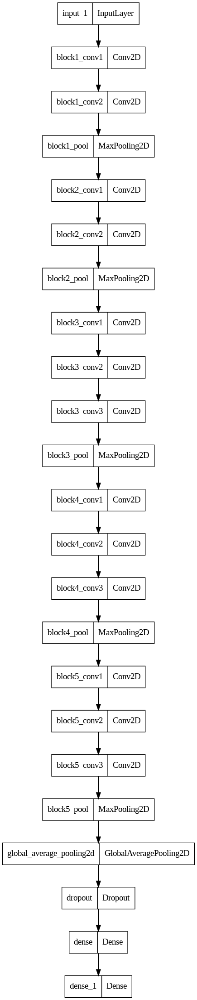

In [ ]:
plot_model(model)

In [ ]:
import sklearn.metrics as metrics
from sklearn.metrics import classification_report, confusion_matrix, f1_score, accuracy_score

In [ ]:
def evaluation_report(model, history, X_test, y_test, name="Ground RGB", classes=["Healthy", "Stage 1", "Stage 2","Stage 3"]):
  print(f"Evaluation Report for: {name}")
  """
  pd.DataFrame(history.history).plot(figsize=(8,5))
  plt.show()
  """
  evaluation = model.evaluate(X_test, y_test)
  print("Model accuracy: {:.2f}%".format(evaluation[1] * 100))
  print("Model Loss: ",evaluation[0])
  print("\n")

  print('Confusion Matrix')
  pred = model.predict(X_test)
  y_pred = np.argmax(pred, axis=-1)
  y_true = np.argmax(y_test, axis=-1)
  cm = confusion_matrix(y_true,y_pred)
  length=len(classes)
  plt.figure(figsize=(8, 5))
  sns.heatmap(cm, annot=True, vmin=0, fmt='g', cmap='Blues', cbar=False)
  plt.xticks(np.arange(length)+.5, classes, rotation= 0, fontsize=8)
  plt.yticks(np.arange(length)+.3, classes, rotation=90, fontsize=8)
  plt.xlabel("Predicted")
  plt.ylabel("Actual")
  plt.title("Confusion Matrix")
  plt.savefig('confusion_matrix.png', bbox_inches='tight', dpi=150)
  plt.show()
  print("\n")

  print('Classification Report:\n----------------------\n')
  clf_report = classification_report(y_true, y_pred, target_names=classes, output_dict=True)
  fig, ax = plt.subplots(figsize=(8,5))
  sns.heatmap(pd.DataFrame(clf_report).iloc[:-1, :].T, annot=True, cmap="Blues", cbar=False, linewidths=1)
  plt.title('Classification Report')
  plt.show()

### RGB

In [ ]:
X, y = load_image_as_array(containing="rgb")
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

In [ ]:
X_train.shape

(625, 224, 224, 3)

In [ ]:
X_test.shape

(268, 224, 224, 3)

In [ ]:
skf = KFold(3, shuffle=True, random_state=42)
fold = 0

with strategy.scope():
    model = build_model_from_base('densenet201')
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy', Precision(), Recall()])


for train, val in skf.split(X_train,y_train):
    fold+=1
    print("########################################################################")
    print(f"Fold #{fold}")
    print("########################################################################")
    x_train_ = X_train[train]
    y_train_ = y_train[train]
    x_val = X_train[val]
    y_val = y_train[val]
    history = model.fit(x_train_, y_train_, validation_data=(x_val, y_val), epochs=EPOCHS, callbacks=[early_stopping, reduce_lr])

    accuracy = model.evaluate(x_val, y_val)
    print(f"Accuracy: {accuracy[1]}")
    print("\n")


Final Model summary
########################################################################
Fold #1
########################################################################
Epoch 1/100
13/13 [==============================] - 115s 6s/step - loss: 1.1830 - accuracy: 0.5312 - precision_4: 0.6189 - recall_4: 0.3630 - val_loss: 0.9777 - val_accuracy: 0.6316 - val_precision_4: 0.6443 - val_recall_4: 0.5981 - lr: 0.0010
Epoch 2/100
13/13 [==============================] - 3s 231ms/step - loss: 0.6580 - accuracy: 0.7236 - precision_4: 0.7926 - recall_4: 0.6154 - val_loss: 0.5690 - val_accuracy: 0.7703 - val_precision_4: 0.7956 - val_recall_4: 0.6890 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 4s 312ms/step - loss: 0.4605 - accuracy: 0.8413 - precision_4: 0.9036 - recall_4: 0.7885 - val_loss: 0.4565 - val_accuracy: 0.8469 - val_precision_4: 0.8564 - val_recall_4: 0.7990 - lr: 0.0010
Epoch 4/100
13/13 [==============================] - 4s 352ms/step - loss: 0.3681 - accur

Evaluation Report for: Ground RGB
9/9 [==============================] - 2s 75ms/step - loss: 0.2781 - accuracy: 0.9030 - precision_4: 0.9060 - recall_4: 0.8993
Model accuracy: 90.30%
Model Loss:  0.2780826687812805


Confusion Matrix
9/9 [==============================] - 47s 5s/step


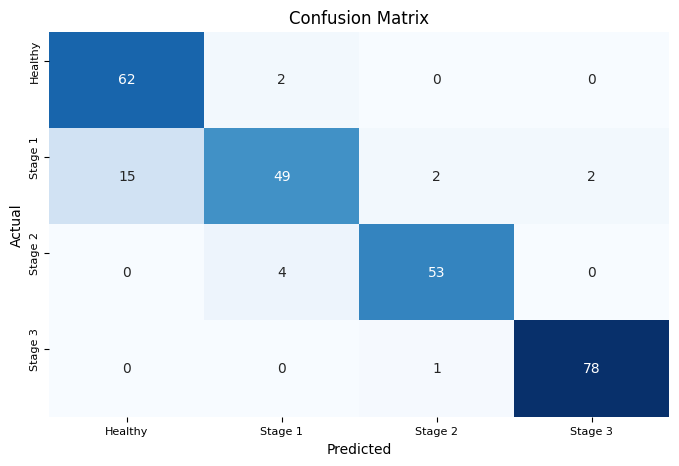



Classification Report:
----------------------



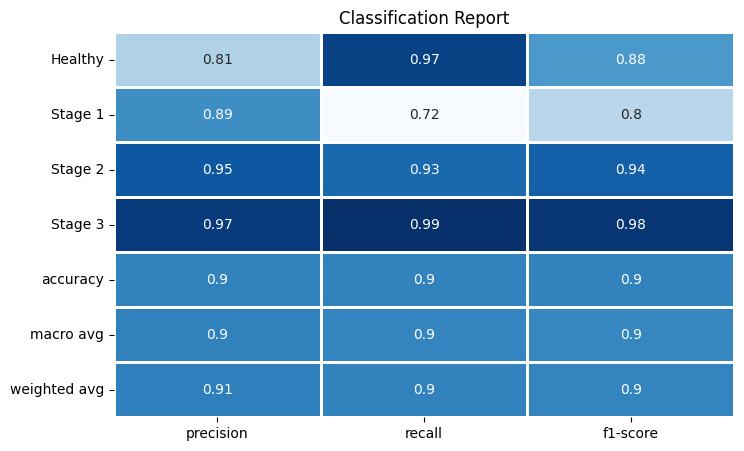

In [ ]:
evaluation_report(model, history, X_test, y_test, name="Ground RGB")

## Multispectral

#### GREEN

In [ ]:
X, y = load_image_as_array(containing="multi_green")
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

In [ ]:
skf = KFold(3, shuffle=True, random_state=42)
fold = 0

with strategy.scope():
    model = build_model_from_base('densenet201')
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy', Precision(), Recall()])


for train, val in skf.split(X_train,y_train):
    fold+=1
    print("########################################################################")
    print(f"Fold #{fold}")
    print("########################################################################")
    x_train_ = X_train[train]
    y_train_ = y_train[train]
    x_val = X_train[val]
    y_val = y_train[val]
    history = model.fit(x_train_, y_train_, validation_data=(x_val, y_val), epochs=EPOCHS, callbacks=[early_stopping, reduce_lr])

    accuracy = model.evaluate(x_val, y_val)
    print(f"Accuracy: {accuracy[1]}")
    print("\n")


Final Model summary
########################################################################
Fold #1
########################################################################
Epoch 1/100
13/13 [==============================] - 100s 5s/step - loss: 1.1045 - accuracy: 0.4829 - precision_6: 0.6500 - recall_6: 0.3171 - val_loss: 0.8174 - val_accuracy: 0.6990 - val_precision_6: 0.8151 - val_recall_6: 0.4709 - lr: 0.0010
Epoch 2/100
13/13 [==============================] - 4s 318ms/step - loss: 0.7290 - accuracy: 0.7317 - precision_6: 0.7979 - recall_6: 0.5585 - val_loss: 0.7416 - val_accuracy: 0.7039 - val_precision_6: 0.7750 - val_recall_6: 0.6019 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 4s 298ms/step - loss: 0.5907 - accuracy: 0.8049 - precision_6: 0.8324 - recall_6: 0.7146 - val_loss: 0.6353 - val_accuracy: 0.7816 - val_precision_6: 0.8278 - val_recall_6: 0.7233 - lr: 0.0010
Epoch 4/100
13/13 [==============================] - 2s 184ms/step - loss: 0.4979 - accur

Evaluation Report for: Ground Multispectral Green
9/9 [==============================] - 1s 55ms/step - loss: 0.4042 - accuracy: 0.8561 - precision_6: 0.8582 - recall_6: 0.8485
Model accuracy: 85.61%
Model Loss:  0.40422776341438293


Confusion Matrix
9/9 [==============================] - 49s 5s/step


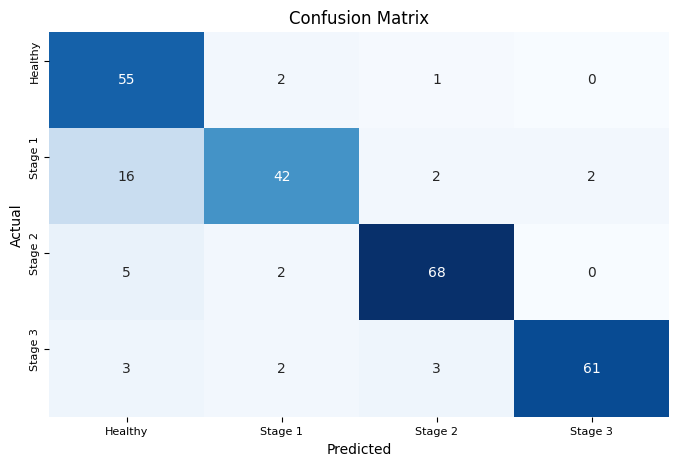



Classification Report:
----------------------



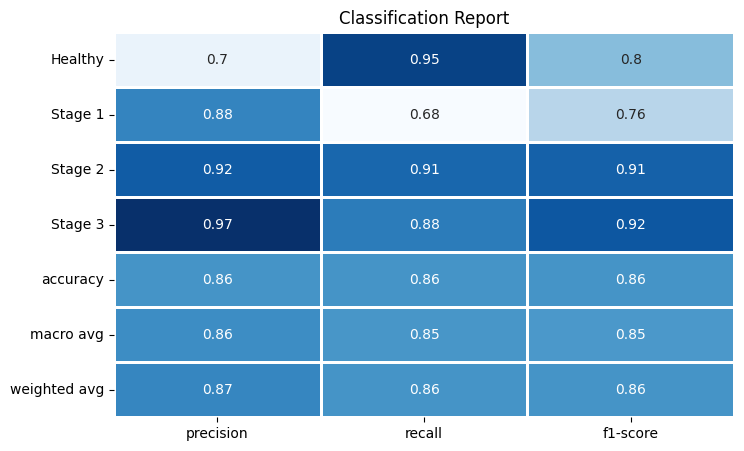

In [ ]:
evaluation_report(model, history, X_test, y_test, name="Ground Multispectral Green")

#### NIR

In [ ]:
X, y = load_image_as_array(containing="multi_nir")
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

In [ ]:
skf = KFold(3, shuffle=True, random_state=42)
fold = 0

with strategy.scope():
    model = build_model_from_base('densenet201')
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy', Precision(), Recall()])


for train, val in skf.split(X_train,y_train):
    fold+=1
    print("########################################################################")
    print(f"Fold #{fold}")
    print("########################################################################")
    x_train_ = X_train[train]
    y_train_ = y_train[train]
    x_val = X_train[val]
    y_val = y_train[val]
    history = model.fit(x_train_, y_train_, validation_data=(x_val, y_val), epochs=EPOCHS, callbacks=[early_stopping, reduce_lr])

    accuracy = model.evaluate(x_val, y_val)
    print(f"Accuracy: {accuracy[1]}")
    print("\n")


Final Model summary
########################################################################
Fold #1
########################################################################
Epoch 1/100
13/13 [==============================] - 97s 5s/step - loss: 1.2050 - accuracy: 0.4712 - precision_8: 0.5219 - recall_8: 0.3438 - val_loss: 0.8770 - val_accuracy: 0.6507 - val_precision_8: 0.6971 - val_recall_8: 0.5837 - lr: 0.0010
Epoch 2/100
13/13 [==============================] - 2s 148ms/step - loss: 0.7987 - accuracy: 0.6875 - precision_8: 0.7604 - recall_8: 0.5721 - val_loss: 0.6748 - val_accuracy: 0.7512 - val_precision_8: 0.8366 - val_recall_8: 0.6124 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 2s 139ms/step - loss: 0.6031 - accuracy: 0.7812 - precision_8: 0.8254 - recall_8: 0.7043 - val_loss: 0.6059 - val_accuracy: 0.7656 - val_precision_8: 0.8555 - val_recall_8: 0.7081 - lr: 0.0010
Epoch 4/100
13/13 [==============================] - 2s 142ms/step - loss: 0.4924 - accura

Evaluation Report for: Ground Multispectral NIR
9/9 [==============================] - 1s 73ms/step - loss: 0.3347 - accuracy: 0.8545 - precision_8: 0.8707 - recall_8: 0.8545
Model accuracy: 85.45%
Model Loss:  0.33472973108291626


Confusion Matrix
9/9 [==============================] - 46s 5s/step


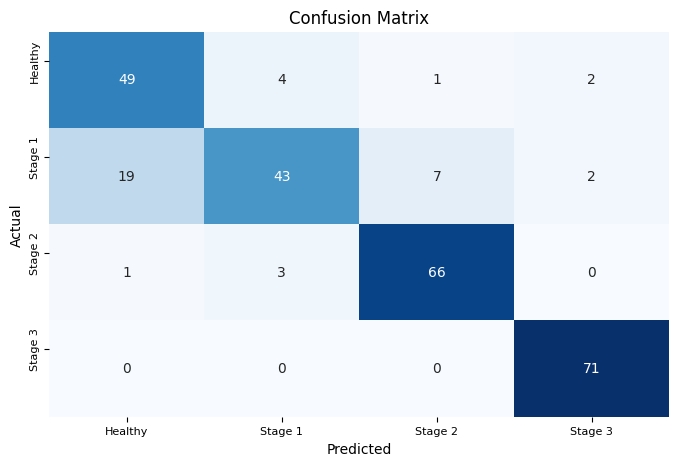



Classification Report:
----------------------



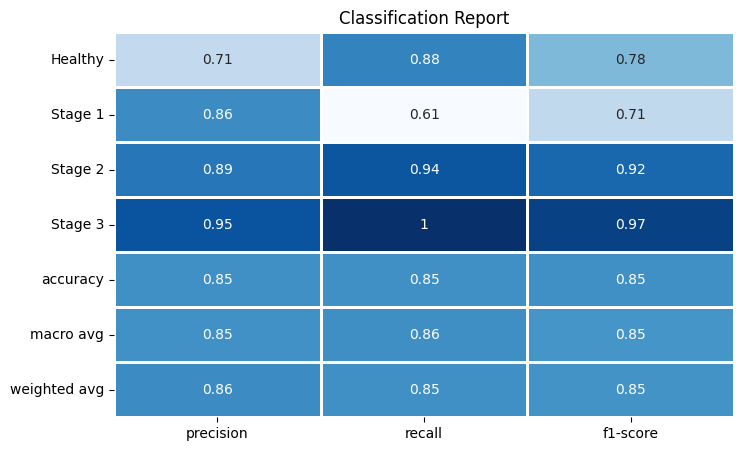

In [ ]:
evaluation_report(model, history, X_test, y_test, name="Ground Multispectral NIR")

#### RED

In [ ]:
X, y = load_image_as_array(containing="multi_red")
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

In [ ]:
skf = KFold(3, shuffle=True, random_state=42)
fold = 0

with strategy.scope():
    model = build_model_from_base('densenet201')
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy', Precision(), Recall()])


for train, val in skf.split(X_train,y_train):
    fold+=1
    print("########################################################################")
    print(f"Fold #{fold}")
    print("########################################################################")
    x_train_ = X_train[train]
    y_train_ = y_train[train]
    x_val = X_train[val]
    y_val = y_train[val]
    history = model.fit(x_train_, y_train_, validation_data=(x_val, y_val), epochs=EPOCHS, callbacks=[early_stopping, reduce_lr])

    accuracy = model.evaluate(x_val, y_val)
    print(f"Accuracy: {accuracy[1]}")
    print("\n")

Final Model summary
########################################################################
Fold #1
########################################################################
Epoch 1/100
13/13 [==============================] - 94s 4s/step - loss: 1.2074 - accuracy: 0.4591 - precision_10: 0.5787 - recall_10: 0.2740 - val_loss: 0.9306 - val_accuracy: 0.6651 - val_precision_10: 0.7480 - val_recall_10: 0.4545 - lr: 0.0010
Epoch 2/100
13/13 [==============================] - 2s 138ms/step - loss: 0.8903 - accuracy: 0.6106 - precision_10: 0.7194 - recall_10: 0.4808 - val_loss: 0.7301 - val_accuracy: 0.7368 - val_precision_10: 0.8333 - val_recall_10: 0.5981 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 2s 188ms/step - loss: 0.7195 - accuracy: 0.7284 - precision_10: 0.7822 - recall_10: 0.6130 - val_loss: 0.6711 - val_accuracy: 0.7416 - val_precision_10: 0.8061 - val_recall_10: 0.6364 - lr: 0.0010
Epoch 4/100
13/13 [==============================] - 4s 311ms/step - loss: 0.5

Evaluation Report for: Ground Multispectral RED
9/9 [==============================] - 1s 57ms/step - loss: 0.3995 - accuracy: 0.8545 - precision_10: 0.8636 - recall_10: 0.8507
Model accuracy: 85.45%
Model Loss:  0.39954674243927


Confusion Matrix
9/9 [==============================] - 49s 5s/step


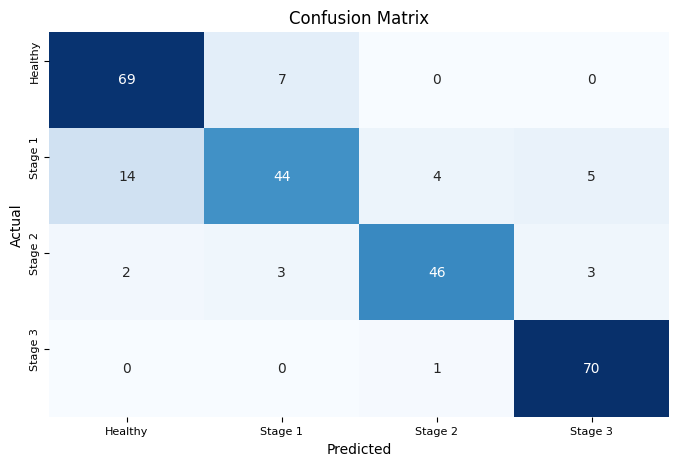



Classification Report:
----------------------



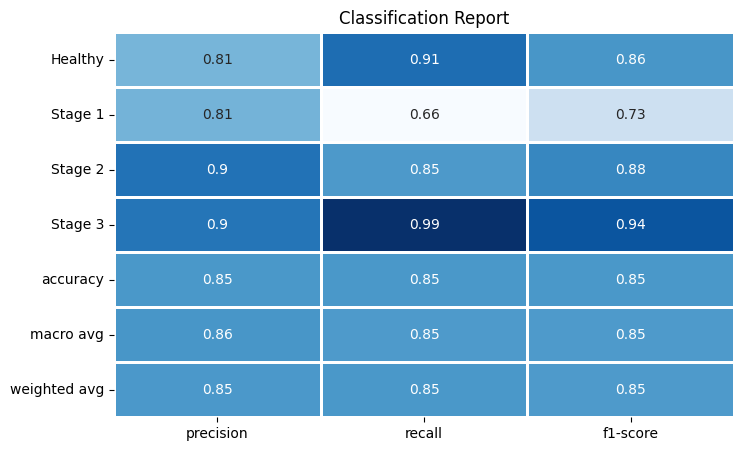

In [ ]:
evaluation_report(model, history, X_test, y_test, name="Ground Multispectral RED")

#### REDEDGE

In [ ]:
X, y = load_image_as_array(containing="multi_rededge")
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

In [ ]:
skf = KFold(3, shuffle=True, random_state=42)
fold = 0

with strategy.scope():
    model = build_model_from_base('densenet201')
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy', Precision(), Recall()])


for train, val in skf.split(X_train,y_train):
    fold+=1
    print("########################################################################")
    print(f"Fold #{fold}")
    print("########################################################################")
    x_train_ = X_train[train]
    y_train_ = y_train[train]
    x_val = X_train[val]
    y_val = y_train[val]
    history = model.fit(x_train_, y_train_, validation_data=(x_val, y_val), epochs=EPOCHS, callbacks=[early_stopping, reduce_lr])

    accuracy = model.evaluate(x_val, y_val)
    print(f"Accuracy: {accuracy[1]}")
    print("\n")

Final Model summary
########################################################################
Fold #1
########################################################################
Epoch 1/100
13/13 [==============================] - 94s 4s/step - loss: 1.3063 - accuracy: 0.4327 - precision_12: 0.5068 - recall_12: 0.2692 - val_loss: 0.9843 - val_accuracy: 0.5742 - val_precision_12: 0.6710 - val_recall_12: 0.4976 - lr: 0.0010
Epoch 2/100
13/13 [==============================] - 2s 143ms/step - loss: 0.8275 - accuracy: 0.6370 - precision_12: 0.7500 - recall_12: 0.5120 - val_loss: 0.7753 - val_accuracy: 0.6746 - val_precision_12: 0.7806 - val_recall_12: 0.5789 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 2s 142ms/step - loss: 0.6222 - accuracy: 0.7764 - precision_12: 0.8253 - recall_12: 0.6587 - val_loss: 0.5761 - val_accuracy: 0.8230 - val_precision_12: 0.8841 - val_recall_12: 0.6938 - lr: 0.0010
Epoch 4/100
13/13 [==============================] - 2s 142ms/step - loss: 0.5

Evaluation Report for: Ground Multispectral REDEDGE
9/9 [==============================] - 1s 57ms/step - loss: 0.2946 - accuracy: 0.9067 - precision_12: 0.9091 - recall_12: 0.8955
Model accuracy: 90.67%
Model Loss:  0.29462388157844543


Confusion Matrix
9/9 [==============================] - 47s 5s/step


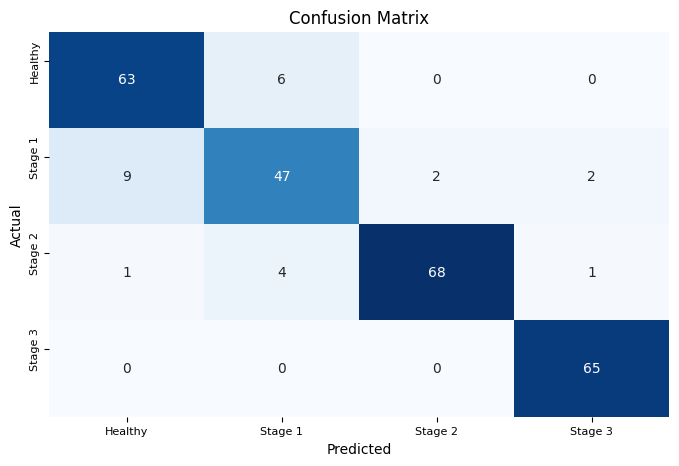



Classification Report:
----------------------



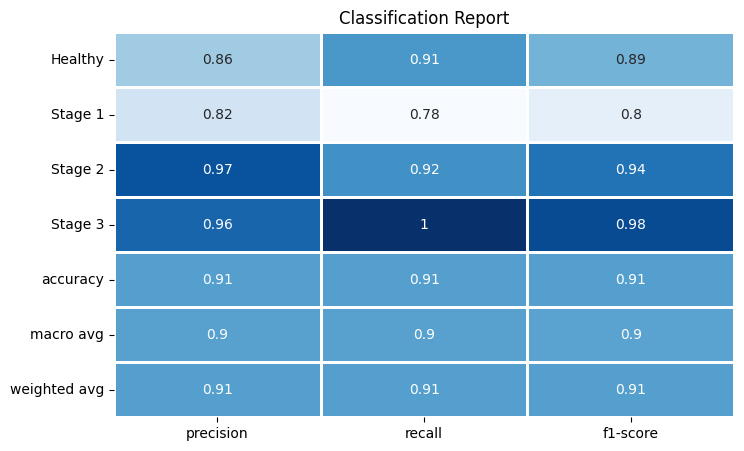

In [ ]:
evaluation_report(model, history, X_test, y_test, name="Ground Multispectral REDEDGE")

#### RGB

In [ ]:
X, y = load_image_as_array(containing="multi_rgb")
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

In [ ]:
skf = KFold(3, shuffle=True, random_state=42)
fold = 0

with strategy.scope():
    model = build_model_from_base('densenet201')
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy', Precision(), Recall()])


for train, val in skf.split(X_train,y_train):
    fold+=1
    print("########################################################################")
    print(f"Fold #{fold}")
    print("########################################################################")
    x_train_ = X_train[train]
    y_train_ = y_train[train]
    x_val = X_train[val]
    y_val = y_train[val]
    history = model.fit(x_train_, y_train_, validation_data=(x_val, y_val), epochs=EPOCHS, callbacks=[early_stopping, reduce_lr])

    accuracy = model.evaluate(x_val, y_val)
    print(f"Accuracy: {accuracy[1]}")
    print("\n")


Final Model summary
########################################################################
Fold #1
########################################################################
Epoch 1/100
13/13 [==============================] - 96s 4s/step - loss: 1.0875 - accuracy: 0.5366 - precision_14: 0.6087 - recall_14: 0.3415 - val_loss: 0.7819 - val_accuracy: 0.6634 - val_precision_14: 0.7285 - val_recall_14: 0.5366 - lr: 0.0010
Epoch 2/100
13/13 [==============================] - 2s 153ms/step - loss: 0.6692 - accuracy: 0.7220 - precision_14: 0.7636 - recall_14: 0.6146 - val_loss: 0.7721 - val_accuracy: 0.7024 - val_precision_14: 0.7351 - val_recall_14: 0.6634 - lr: 0.0010
Epoch 3/100
13/13 [==============================] - 2s 169ms/step - loss: 0.5718 - accuracy: 0.7805 - precision_14: 0.8187 - recall_14: 0.7049 - val_loss: 0.5610 - val_accuracy: 0.7512 - val_precision_14: 0.8000 - val_recall_14: 0.6829 - lr: 0.0010
Epoch 4/100
13/13 [==============================] - 2s 147ms/step - loss: 0.4

Evaluation Report for: Ground Multispectral RGB
9/9 [==============================] - 1s 58ms/step - loss: 0.3009 - accuracy: 0.8902 - precision_14: 0.9000 - recall_14: 0.8864
Model accuracy: 89.02%
Model Loss:  0.3009290397167206


Confusion Matrix
9/9 [==============================] - 47s 5s/step


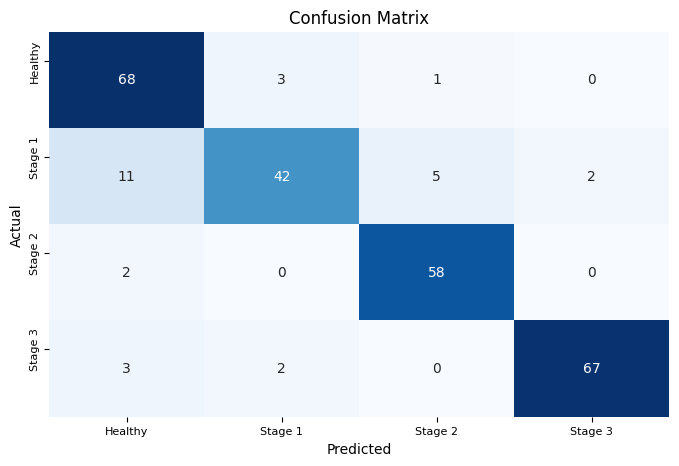



Classification Report:
----------------------



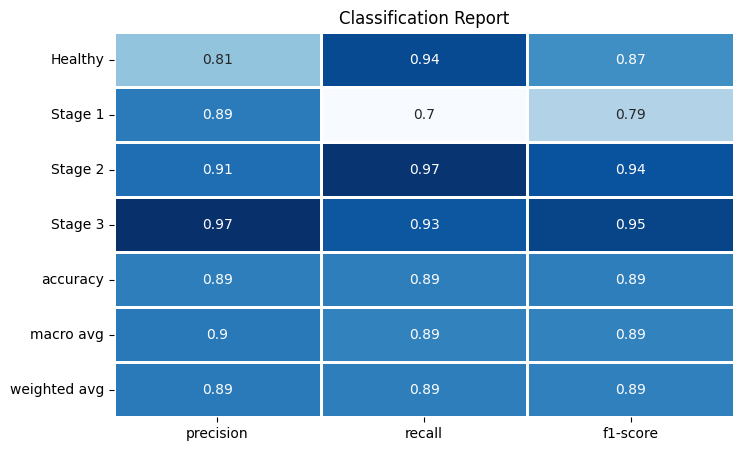

In [ ]:
evaluation_report(model, history, X_test, y_test, name="Ground Multispectral RGB")

# Multimodal Modeling

In [ ]:
RGB_X, RGB_y = load_image_as_array(containing="combined_rgb")
REG_X, REG_y = load_image_as_array(containing="combined_multi")

# Splitting data
indexes = np.arange(int(RGB_X.shape[0]*0.30))
np.random.shuffle(indexes)

RGB_X_train = RGB_X[indexes]
RGB_y_train = RGB_y[indexes]
RGB_X_test = RGB_X[~indexes]
RGB_y_test = RGB_y[~indexes]

REG_X_train = REG_X[indexes]
REG_y_train = REG_y[indexes]
REG_X_test = REG_X[~indexes]
REG_y_test = REG_y[~indexes]

In [ ]:
def deep_evaluation_report(model, history, X_test_1, X_test_2, y_test, name="Ground RGB", classes=["Healthy", "Stage 1", "Stage 2","Stage 3"]):
  print(f"Evaluation Report for: {name}")
  """
  pd.DataFrame(history.history).plot(figsize=(8,5))
  plt.show()
  """
  evaluation = model.evaluate([X_test_1, X_test_2], y_test)
  print("Model accuracy: {:.2f}%".format(evaluation[1] * 100))
  print("Model Loss: ",evaluation[0])
  print("\n")

  print('Confusion Matrix')
  pred = model.predict([X_test_1, X_test_2])
  y_pred = np.argmax(pred, axis=-1)
  y_true = np.argmax(y_test, axis=-1)
  cm = confusion_matrix(y_true,y_pred)
  length=len(classes)
  plt.figure(figsize=(8, 5))
  sns.heatmap(cm, annot=True, vmin=0, fmt='g', cmap='Blues', cbar=False)
  plt.xticks(np.arange(length)+.5, classes, rotation= 0, fontsize=8)
  plt.yticks(np.arange(length)+.3, classes, rotation=90, fontsize=8)
  plt.xlabel("Predicted")
  plt.ylabel("Actual")
  plt.title("Confusion Matrix")
  plt.savefig('confusion_matrix.png', bbox_inches='tight', dpi=150)
  plt.show()
  print("\n")

  print('Classification Report:\n----------------------\n')
  clf_report = classification_report(y_true, y_pred, target_names=classes, output_dict=True)
  fig, ax = plt.subplots(figsize=(8,5))
  sns.heatmap(pd.DataFrame(clf_report).iloc[:-1, :].T, annot=True, cmap="Blues", cbar=False, linewidths=1)
  plt.title('Classification Report')
  plt.show()

## Late Fusion

In [ ]:
def base_model(base, name):
    if base == "vgg16":
      conv_base = VGG16(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    if base == "inceptionv3":
      conv_base = InceptionV3(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    if base == "densenet201":
      conv_base = DenseNet201(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    if base == "resnet50":
      conv_base = ResNet50(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    for layer in conv_base.layers:
        layer.trainable = False

    # Add classification layers
    x = conv_base.output
    x = GlobalAveragePooling2D()(x)
    x = Dropout(DROPOUT_PROB)(x)
    x = Dense(128, activation='relu')(x)
    predictions = Dense(NUM_CLASSES, activation='softmax')(x)
    model = Model(inputs=conv_base.input, outputs=predictions)

    # Set unique names for layers
    for layer in model.layers:
        layer._name = name + '_' + layer.name

    model._name = name + '_model'  # Set unique name for the model

    return model

In [ ]:
def build_late_fusion_model():

    # Ground RGB
    base_model1 = base_model(base="densenet201", name="Ground_RGB")
    x1 = base_model1.output

    # Ground Multispectral REDEDGE
    base_model2 = base_model(base="densenet201", name="Multispectral_REDEDGE")
    x2 = base_model2.output

    # LATE FUSION
    x = concatenate([x1, x2])

    # Classification Model
    x = Sequential()(x)
    x = Dense(x.shape[1], activation='relu')(x) #12
    x = Dropout(DROPOUT_PROB)(x)
    x = Dense(x.shape[1]//2, activation='relu')(x) #8
    x = Dropout(DROPOUT_PROB)(x)
    predictions = Dense(NUM_CLASSES, activation='softmax')(x)

    model = Model(inputs=[base_model1.input, base_model2.input], outputs=predictions) # Inputs go into two different layers

    return model

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.412574 to fit



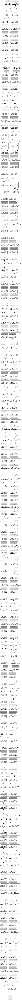

In [ ]:
late_model = build_late_fusion_model()
plot_model(late_model, show_shapes=True)

In [ ]:
skf = KFold(3, shuffle=True, random_state=42)
fold = 0

with strategy.scope():
    model = build_late_fusion_model()
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy', Precision(), Recall()])


for train, val in skf.split(RGB_X_train, RGB_y_train):
    fold+=1
    print("########################################################################")
    print(f"Fold #{fold}")
    print("########################################################################")
    rgb_x_train_ = RGB_X_train[train]
    rgb_y_train_ = RGB_y_train[train]
    rgb_x_val = RGB_X_train[val]
    rgb_y_val = RGB_y_train[val]

    reg_x_train_ = REG_X_train[train]
    reg_y_train_ = REG_y_train[train]
    reg_x_val = REG_X_train[val]
    reg_y_val = REG_y_train[val]

    history = model.fit([rgb_x_train_, reg_x_train_], rgb_y_train_,
                        validation_data=([rgb_x_val, reg_x_val], rgb_y_val),
                        batch_size = BATCH_SIZE, epochs=EPOCHS, callbacks=[early_stopping, reduce_lr])

    accuracy = model.evaluate([rgb_x_val, reg_x_val], [rgb_y_val, ])
    print("\n")


74836368/74836368 [==============================] - 1s 0us/step
########################################################################
Fold #1
########################################################################
Epoch 1/100
2/2 [==============================] - 153s 77s/step - loss: 1.3959 - accuracy: 0.2303 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 1.3864 - val_accuracy: 0.2472 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - lr: 0.0010
Epoch 2/100
2/2 [==============================] - 2s 1s/step - loss: 1.3748 - accuracy: 0.2416 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 1.3804 - val_accuracy: 0.2472 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - lr: 0.0010
Epoch 3/100
2/2 [==============================] - 1s 1s/step - loss: 1.3746 - accuracy: 0.2978 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 1.3616 - val_accuracy: 0.2472 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - lr: 0.0010
Epoch 4/100
2/2 [==============

Evaluation Report for: Late Fusion
9/9 [==============================] - 35s 4s/step - loss: 0.9597 - accuracy: 0.5094 - precision: 0.8537 - recall: 0.2622
Model accuracy: 50.94%
Model Loss:  0.9596715569496155


Confusion Matrix
9/9 [==============================] - 77s 8s/step


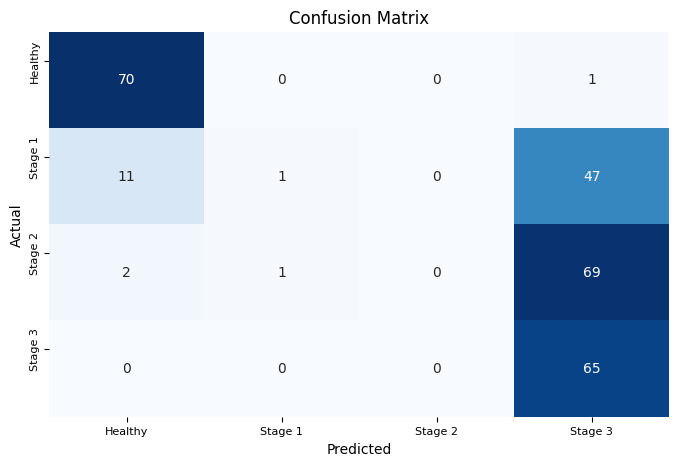



Classification Report:
----------------------



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


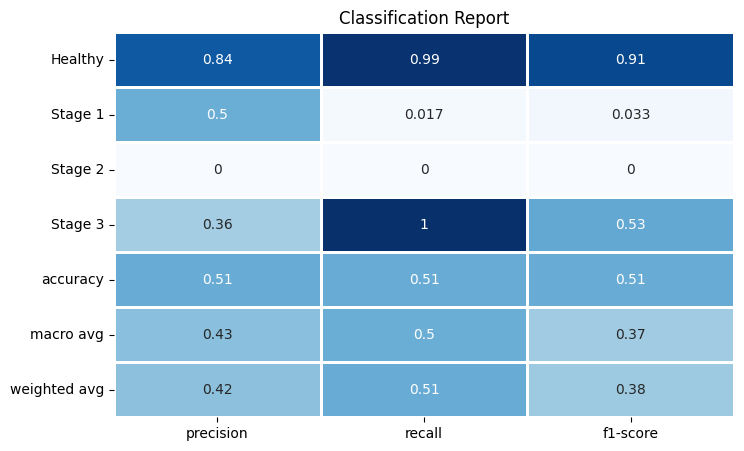

In [ ]:
deep_evaluation_report(model, history, RGB_X_test, REG_X_test, RGB_y_test, name="Late Fusion")

## Early Fusion

In [ ]:
def early_base_model(base, name): # Use as Features Extraction
    if base == "vgg16":
      conv_base = VGG16(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    if base == "inceptionv3":
      conv_base = InceptionV3(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    if base == "densenet201":
      conv_base = DenseNet201(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    if base == "resnet50":
      conv_base = ResNet50(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    for layer in conv_base.layers:
        layer.trainable = False

    x = GlobalAveragePooling2D()(conv_base.output)
    predictions = Flatten()(x)
    model = Model(inputs=conv_base.input, outputs=predictions)

    # Set unique names for layers
    for layer in model.layers:
        layer._name = name + '_' + layer.name

    model._name = name + '_model'  # Set unique name for the model

    return model

In [ ]:
def build_early_fusion_model():

    # Ground RGB
    base_model1 = early_base_model(base="densenet201", name="Ground_RGB")
    x1 = base_model1.output

    # Ground Multispectral REDEDGE
    base_model2 = early_base_model(base="densenet201", name="Multispectral_REDEDGE")
    x2 = base_model2.output

    # LATE FUSION
    x = concatenate([x1, x2])

    # Classification Model
    x = Sequential()(x)
    x = Dense(x.shape[1], activation='relu')(x) #12
    x = Dropout(DROPOUT_PROB)(x)
    x = Dense(x.shape[1]//2, activation='relu')(x) #8
    x = Dropout(DROPOUT_PROB)(x)
    predictions = Dense(NUM_CLASSES, activation='softmax')(x)

    model = Model(inputs=[base_model1.input, base_model2.input], outputs=predictions)

    return model

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.413725 to fit



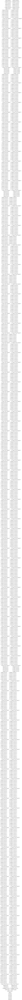

In [ ]:
early_model = build_early_fusion_model()
plot_model(early_model, show_shapes=True)

In [ ]:
skf = KFold(3, shuffle=True, random_state=42)
fold = 0

with strategy.scope():
    model = build_early_fusion_model()
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy', Precision(), Recall()])


for train, val in skf.split(RGB_X_train, RGB_y_train):
    fold+=1
    print("########################################################################")
    print(f"Fold #{fold}")
    print("########################################################################")
    rgb_x_train_ = RGB_X_train[train]
    rgb_y_train_ = RGB_y_train[train]
    rgb_x_val = RGB_X_train[val]
    rgb_y_val = RGB_y_train[val]

    reg_x_train_ = REG_X_train[train]
    reg_y_train_ = REG_y_train[train]
    reg_x_val = REG_X_train[val]
    reg_y_val = REG_y_train[val]

    history = model.fit([rgb_x_train_, reg_x_train_], rgb_y_train_,
                        validation_data=([rgb_x_val, reg_x_val], rgb_y_val),
                        batch_size = BATCH_SIZE, epochs=EPOCHS, callbacks=[early_stopping, reduce_lr])

    accuracy = model.evaluate([rgb_x_val, reg_x_val], [rgb_y_val, ])
    print("\n")


########################################################################
Fold #1
########################################################################
Epoch 1/100
2/2 [==============================] - 166s 85s/step - loss: 2.8491 - accuracy: 0.2753 - precision_2: 0.3750 - recall_2: 0.1348 - val_loss: 19.9874 - val_accuracy: 0.2022 - val_precision_2: 0.2022 - val_recall_2: 0.2022 - lr: 0.0010
Epoch 2/100
2/2 [==============================] - 2s 1s/step - loss: 14.5550 - accuracy: 0.2640 - precision_2: 0.2640 - recall_2: 0.2640 - val_loss: 4.0153 - val_accuracy: 0.4719 - val_precision_2: 0.4719 - val_recall_2: 0.4719 - lr: 0.0010
Epoch 3/100
2/2 [==============================] - 2s 1s/step - loss: 3.7220 - accuracy: 0.4719 - precision_2: 0.4852 - recall_2: 0.4607 - val_loss: 2.9523 - val_accuracy: 0.2921 - val_precision_2: 0.2921 - val_recall_2: 0.2921 - lr: 0.0010
Epoch 4/100
2/2 [==============================] - 1s 1s/step - loss: 2.8048 - accuracy: 0.3034 - precision_2: 0.2982 

Evaluation Report for: Early Fusion
9/9 [==============================] - 35s 4s/step - loss: 0.5211 - accuracy: 0.8390 - precision_2: 0.8390 - recall_2: 0.8390
Model accuracy: 83.90%
Model Loss:  0.5211411714553833


Confusion Matrix
9/9 [==============================] - 82s 9s/step


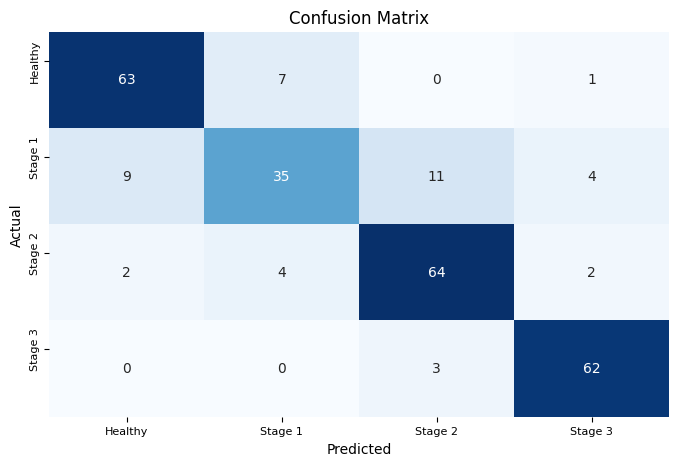



Classification Report:
----------------------



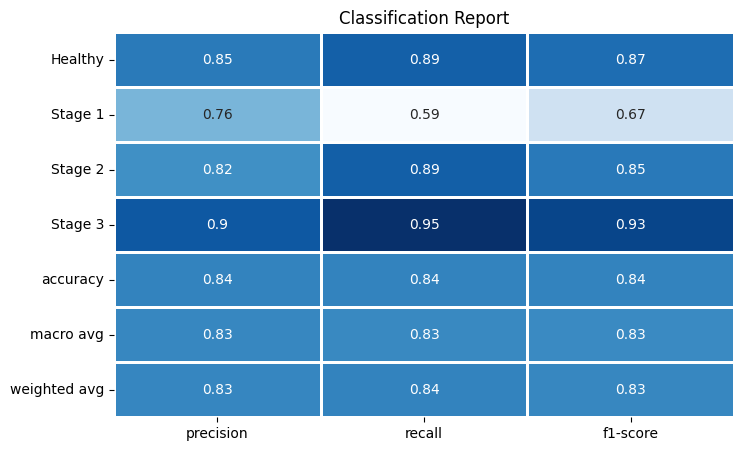

In [ ]:
deep_evaluation_report(model, history, RGB_X_test, REG_X_test, RGB_y_test, name="Early Fusion")

In [ ]:
model.evaluate([RGB_X_train, REG_X_train], RGB_y_train)

9/9 [==============================] - 2s 111ms/step - loss: 0.0282 - accuracy: 0.9888 - precision_2: 0.9888 - recall_2: 0.9888


[0.02824689820408821,
 0.9887640476226807,
 0.9887640476226807,
 0.9887640476226807]

### Saving the model

In [ ]:
!pip install tensorflow onnxruntime keras2onnx==1.7.0 -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.8/83.8 kB 7.2 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
orbax-checkpoint 0.4.4 requires jax>=0.4.9, but you have jax 0.3.25 which is incompatible.
pandas-gbq 0.19.2 requires google-auth-oauthlib>=0.7.0, but you have google-auth-oauthlib 0.4.6 which is incompatible.
tensorflow-metadata 1.14.0 requires protobuf<4.21,>=3.20.3, but you have protobuf 4.25.3 which is incompatible.


In [ ]:
model.save("early_fusion.h5")

In [ ]:
import onnx
import os
os.environ['TF_KERAS'] = '0'
import keras2onnx

# convert model to ONNX
onnx_model = keras2onnx.convert_keras(model,       # keras model
                         name="early_fusion",      # the converted ONNX model internal name
                         target_opset=9,           # the ONNX version to export the model to
                         channel_first_inputs=None # which inputs to transpose from NHWC to NCHW
                         )

onnx.save_model(onnx_model, "early_fusion.onnx")